<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Setup</a></span></li><li><span><a href="#Dataset-visualization" data-toc-modified-id="Dataset-visualization-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Dataset visualization</a></span><ul class="toc-item"><li><span><a href="#Example-image/depth-and-xy-projection-of-the-camera-trajectory" data-toc-modified-id="Example-image/depth-and-xy-projection-of-the-camera-trajectory-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Example image/depth and xy-projection of the camera trajectory</a></span></li><li><span><a href="#Pointcloud-and-3D-camera-trajectory" data-toc-modified-id="Pointcloud-and-3D-camera-trajectory-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Pointcloud and 3D camera trajectory</a></span></li><li><span><a href="#Photometric-Image-alignment" data-toc-modified-id="Photometric-Image-alignment-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Photometric Image alignment</a></span></li><li><span><a href="#Pose-error" data-toc-modified-id="Pose-error-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Pose error</a></span></li></ul></li></ul></div>

In [27]:
import numpy
import matplotlib.pyplot as plt
import scipy.optimize
import sys
import json
from tqdm.notebook import tqdm

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
from ipywidgets import widget

from se3 import Se3

import ipywidgets as widgets
import os
from os.path import join

%matplotlib notebook

%load_ext autoreload
%autoreload 2
fig_3d = None
fig2 = None

import torch
import os

interactive = False # plotly plots can't be exported from FigureWidgets, so set this to False before exporting

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


This repo contains a baic SE3 implementation based on pytorch and a notebook for visualizing the TartanAir dataset

## Setup

Download the "carwelding" example trajectory from https://theairlab.org/tartanair-dataset/

In [18]:
import cv2
base_dir = join(os.path.expanduser('~'), 'workspace/data/P007') # modify this to match download location
pose_list = numpy.loadtxt(join(base_dir, 'pose_left.txt'))
poses = Se3(r=pose_list[:, 3:], t=pose_list[:, :3])

def get_paths(sub_folder):
    return [join(base_dir, sub_folder, f) for f in sorted(os.listdir(join(base_dir, sub_folder)))]

def load_img(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

## Dataset visualization

### Example image/depth and xy-projection of the camera trajectory

<IPython.core.display.Javascript object>


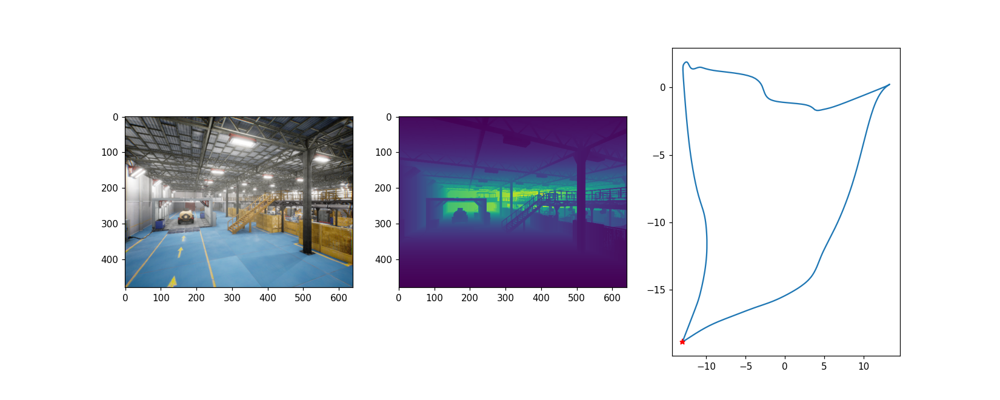

interactive(children=(IntSlider(value=0, continuous_update=False, description='i', max=357), Output()), _dom_c…

<function __main__.plot_img(i)>

In [3]:
image_paths = get_paths('image_left')
depth_paths = get_paths('depth_left')

fig_2d, ax_2d = plt.subplots(1, 3, figsize=(15, 6))
def plot_img(i):
    img = load_img(image_paths[i])
    d = numpy.load(depth_paths[i])
    
    for a in ax_2d:
        a.clear()

    ax_2d[0].imshow(img)
    ax_2d[1].imshow(d)
    ax_2d[2].plot(poses.t[:, 0], poses.t[:, 1])
    ax_2d[2].plot(poses.t[i, 0], poses.t[i, 1], '*r')
    
widgets.interact(plot_img, i=widgets.IntSlider(min=0, max=len(image_paths), continuous_update=False))

### Pointcloud and 3D camera trajectory

In [4]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

In [5]:
img_shape = (480, 640)
Y, X = numpy.meshgrid(range(img_shape[0]), range(img_shape[1]))
X = X.T
Y = Y.T

fx = 320.0  # focal length x
fy = 320.0  # focal length y
cx = 320.0  # optical center x
cy = 240.0  # optical center y

ned2cam = numpy.array([[0., 1., 0.],
                      [0., 0., 1.],
                      [1., 0., 0.]])
camera_poses = Se3(ned2cam) * poses * Se3(ned2cam).inv()

In [6]:
def get_3d_points(depth_img, pose):
    """Get 3d pointcloud from depth image taken at the provided pose."""
    points_3d = numpy.array([
        (depth_img*(X-cx)/fx).reshape(-1),
        (depth_img*(Y-cy)/fy).reshape(-1),
        depth_img.reshape(-1)
    ])
    return pose.transform_points(torch.tensor(points_3d, dtype=torch.get_default_dtype()))

In [7]:
def get_pointcloud_plot_data(points_3d, colors=None, step=1):
    if colors is None:
        colors = 'blue'
    elif len(colors) == 1:
        colors = colors[0]
    else:
        colors = [f'rgba({r},{g},{b},1.0)' for r, g, b in colors[::step]]
        
        
    return dict(
        x=points_3d[0, ::step],
        y=points_3d[1, ::step],
        z=points_3d[2, ::step],
        mode='markers',
        marker={
            'opacity': 1.,
            'size': 2,
            'color': colors
        },
    )

def get_trajectory_plot_data(poses, current_pose_index):
    return dict(
        x=[p.t[0] for p in camera_poses],
        y=[p.t[1] for p in camera_poses],
        z=[p.t[2] for p in camera_poses],
        mode='markers',
        marker={ 
            'color': ['red' if i != current_pose_index else 'blue' for i in range(len(camera_poses))],
            'size': [5 if i != current_pose_index else 20 for i in range(len(camera_poses))]
        }
    )

def set_layout(fig):
    fig.update_layout(
        autosize=False,
        width=1500,
        height=900,
        scene=dict(
            aspectmode='manual',
            xaxis={'range': xaxis},
            yaxis={'range': yaxis},
            zaxis={'range': zaxis},
            aspectratio=dict(
                x=xaxis[1]-xaxis[0],
                y=yaxis[1]-yaxis[0],
                z=zaxis[1]-zaxis[0],
            )
        )
    )
    
default_camera = {
    'center': {'x': 0, 'y': 0, 'z': 0},
    'eye': {'x': 0.9796221167812318, 'y': -40.00026221882771, 'z': -91.6461639291757},
    'projection': {'type': 'perspective'},
    'up': {'x': 0, 'y': 0, 'z': 1}
}

def set_camera(fig, camera_dict):
    fig.layout['scene']['camera'].update(camera_dict)

In [8]:
# make sure previous figure is closed
if hasattr(fig_3d, 'close'):
    fig_3d.close()

# initialize figure
fig_3d = make_subplots(rows=1, cols=1, specs=[[{"type": "scene", 'is_3d': True}]])
if interactive:
    fig_3d = go.FigureWidget(fig_3d)

fig_3d.add_trace(go.Scatter3d())
fig_3d.add_trace(go.Scatter3d())

step = 13
xaxis=[-26, 21]
yaxis=[-8, 2]
zaxis=[-20, 50]
def set_points(i):
    transformed_points = get_3d_points(numpy.load(depth_paths[i]), camera_poses[i])
    img = load_img(image_paths[i])
    
    # plot 3d points
    fig_3d.data[0].update(get_pointcloud_plot_data(
        points_3d=transformed_points,
        colors=img.reshape(-1, 3),
        step=step
    ))
    
    # plot camera trajectory
    fig_3d.data[1].update(get_trajectory_plot_data(poses, i))
    
    # set axis limits etc.
    set_layout(fig_3d)
    
widgets.interact(set_points, i=widgets.IntSlider(min=0, max=len(image_paths), continuous_update=False, value=0))
set_camera(fig_3d, default_camera)
fig_3d

interactive(children=(IntSlider(value=0, continuous_update=False, description='i', max=357), Output()), _dom_c…

### Photometric Image alignment 

A soruce image $I_{\text{src}}$ can be warped to match a target image $I_{\text{target}}$ given the pixel-wise depth $d_{\text{target}}$ and relative pose $\Delta T$

In [9]:
coordinate_grid = numpy.stack([
    X, Y, numpy.ones(img_shape)
], axis=-1)
coordinate_grid = torch.tensor(coordinate_grid, dtype=torch.float32).unsqueeze(0)

In [10]:
import torch.nn.functional as F

h, w = img_shape
K = torch.tensor([
    [fx, 0, cx],
    [0, fy, cy],
    [0, 0, 1]
])
K_inv = torch.inverse(K)

def affine_transform(grid_points, a, b=None):
    return F.conv2d(grid_points.transpose(1, -1), weight=a.view(*a.shape, 1, 1), bias=b).transpose(1, -1)

def transform_points(points, T):
    return affine_transform(points, T.r, T.t)

def transform_image(src_image, target_depth, T):
    global points_2d_normalized, points_3d, points_3d_transformed, points_2d_transformed, sampled_points
    points_2d_normalized = affine_transform(coordinate_grid, K_inv)
    points_3d =  points_2d_normalized * target_depth
    points_3d_transformed = transform_points(points_3d, T)
    points_2d_transformed = points_3d_transformed[..., :2] / points_3d_transformed[..., 2:]
    points_2d_transformed[..., 1] *= w/h
    sampled_points = F.grid_sample(src_image, points_2d_transformed, align_corners=False)
    sampled_points[:, :, points_3d_transformed[0, ..., 2] < 0] = 0
    return sampled_points

def image_diff(src_image, target_image, channel_axis=1):
    return ((src_image/255. - target_image/255.)**2).sum(axis=channel_axis) / numpy.sqrt(3)

<IPython.core.display.Javascript object>


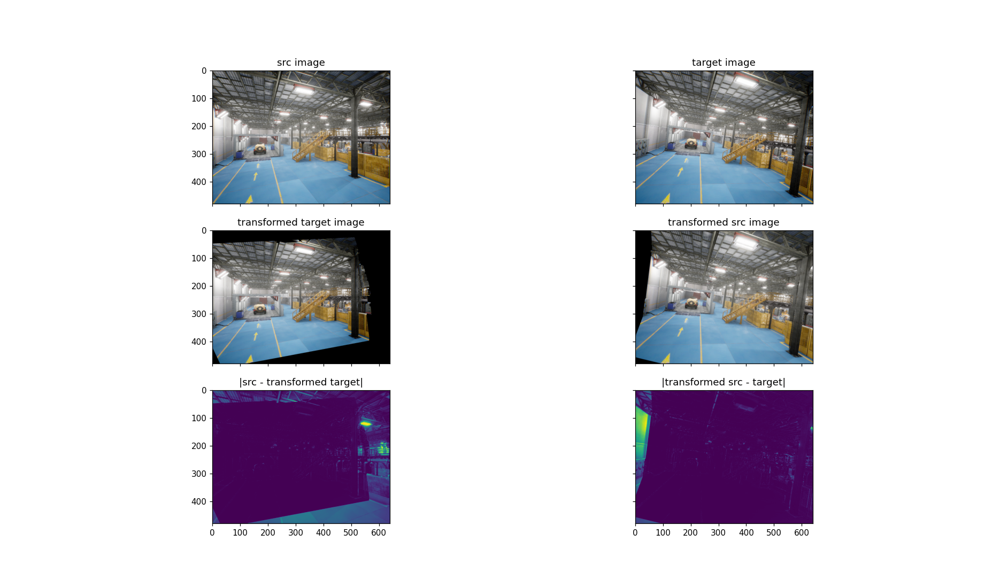

interactive(children=(IntSlider(value=6, continuous_update=False, description='i', max=357), Output()), _dom_c…

In [11]:
fig_img, ax_img = plt.subplots(3, 2, figsize=(17, 10), sharex=True, sharey=True)

if hasattr(fig2, 'close'):
    fig2.close()
fig2 = make_subplots(rows=1, cols=1, specs=[[{"type": "scene", 'is_3d': True}]])
if interactive:
    fig2 = go.FigureWidget()
fig2.add_trace(go.Scatter3d(name='transformed src depth'))
fig2.add_trace(go.Scatter3d(name='target depth'))

def plot_transformed(i):
    global transformed_image
    src_img_np = load_img(image_paths[0])
    src_img = torch.tensor(src_img_np, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
    target_img_np = load_img(image_paths[i])
    target_img = torch.tensor(target_img_np, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
    src_depth = torch.tensor(numpy.load(depth_paths[0])).unsqueeze(0).unsqueeze(-1)
    target_depth = torch.tensor(numpy.load(depth_paths[i])).unsqueeze(0).unsqueeze(-1)
    
    ax_img[0, 0].imshow(src_img_np)
    ax_img[0, 0].set_title('src image')
    
    ax_img[0, 1].imshow(target_img_np)
    ax_img[0, 1].set_title('target image')
    
    transformed_image = transform_image(
        target_img,
        src_depth,
        camera_poses[i].inv() * camera_poses[0]
    )
    ax_img[1, 0].imshow(transformed_image[0].permute(1, 2, 0) / 255)
    ax_img[1, 0].set_title('transformed target image')
    
    
    ax_img[2, 0].imshow(image_diff(transformed_image, src_img)[0])
    ax_img[2, 0].set_title('|src - transformed target|')

    transformed_image = transform_image(
        src_img,
        target_depth,
        camera_poses[0].inv() * camera_poses[i]
    )
    ax_img[1, 1].imshow(transformed_image[0].permute(1, 2, 0) / 255)
    ax_img[1, 1].set_title('transformed src image')
    
    ax_img[2, 1].imshow(image_diff(transformed_image, target_img)[0])
    ax_img[2, 1].set_title('|transformed src - target|')

    # plot 3D points in src camera frame
    src_points_3d = points_2d_normalized * src_depth
    fig2.data[0].update(get_pointcloud_plot_data(points_3d_transformed.reshape(-1, 3).transpose(0, 1), colors=target_img_np.reshape(-1, 3), step=13))
    fig2.data[1].update(get_pointcloud_plot_data(src_points_3d.reshape(-1, 3).transpose(0, 1), colors=src_img_np.reshape(-1, 3), step=13))
    fig2.update_layout(
        autosize=False,
        width=1500,
        height=900,
        scene=dict(
            aspectmode='data',
        )
    )

    
widgets.interact(plot_transformed, i=widgets.IntSlider(min=0, max=len(image_paths), continuous_update=False, value=6))
fig2

### Pose error
The alignment error $\|I_{\text{src}} - I_{\text{target}}\|^2$ can be used to judge the accuracy of the depth and pose. The below plot shows how the alignment error changes when we introduce an error in each degree of freedom of $\Delta T$

In [22]:
i = 6
src_img = torch.tensor(load_img(image_paths[0]), dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
target_img = torch.tensor(load_img(image_paths[i]), dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
target_depth = torch.tensor(numpy.load(depth_paths[i])).unsqueeze(0).unsqueeze(-1)

T0 = camera_poses[0].inv() * camera_poses[i]

def get_loss(T_eps):
    src_img_transformed = transform_image(
        src_img,
        target_depth,
        T0 * T_eps
    )
    valid_pixels = (src_img_transformed != 0).all(axis=1)[0]
    return image_diff(src_img_transformed[..., valid_pixels], target_img[..., valid_pixels]).mean()


In [23]:
t = numpy.linspace(-10, 10, 100)
losses_x = [get_loss(Se3(t=numpy.array([eps, 0, 0]))) for eps in t]
losses_y = [get_loss(Se3(t=numpy.array([0, eps, 0]))) for eps in t]
losses_z = [get_loss(Se3(t=numpy.array([0, 0, eps]))) for eps in t]

thetas = numpy.linspace(-numpy.pi/4, numpy.pi/4, 100)
losses_rx = [get_loss(Se3(r=numpy.array([numpy.sin(theta/2), 0, 0, numpy.cos(theta/2)]))) for theta in thetas]
losses_ry = [get_loss(Se3(r=numpy.array([0, numpy.sin(theta/2), 0, numpy.cos(theta/2)]))) for theta in thetas]
losses_rz = [get_loss(Se3(r=numpy.array([0, 0, numpy.sin(theta/2), numpy.cos(theta/2)]))) for theta in thetas]

<IPython.core.display.Javascript object>


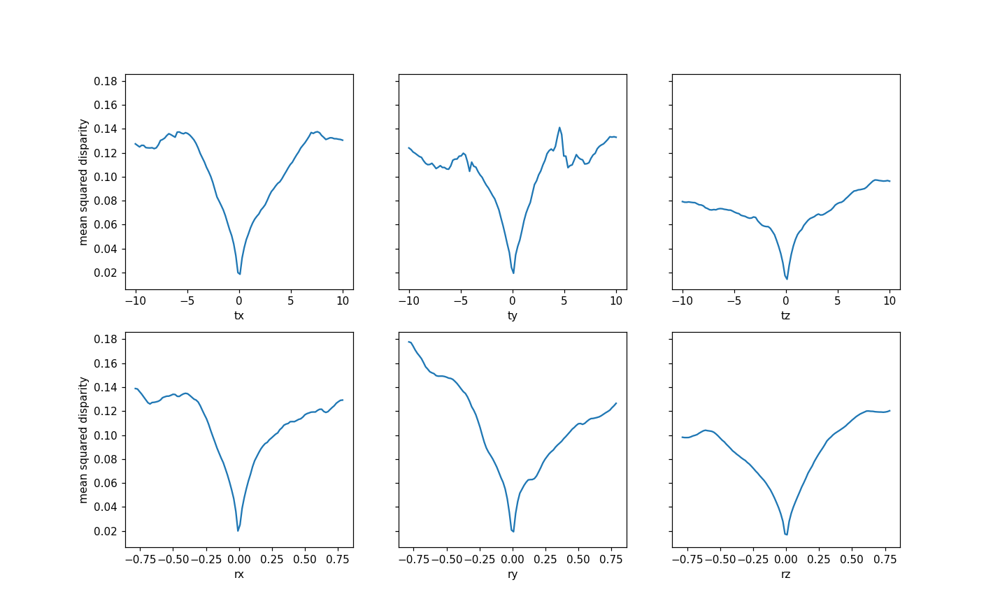

In [24]:
fig, ax = plt.subplots(2, 3, figsize=(13, 8), sharey=True, sharex='row')
ax[0, 0].plot(t, losses_x)
ax[0, 1].plot(t, losses_y)
ax[0, 2].plot(t, losses_z)
ax[1, 0].plot(thetas, losses_rx)
ax[1, 1].plot(thetas, losses_ry)
ax[1, 2].plot(thetas, losses_rz)

for a in ax[:, 0]:
    a.set_ylabel('mean squared disparity')
for i in range(3):
    ax[0, i].set_xlabel(f't{["x", "y", "z"][i]}')
    ax[1, i].set_xlabel(f'r{["x", "y", "z"][i]}')